In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from warnings import filterwarnings

plt.rc('font', family = 'AppleGothic')
filterwarnings('ignore')

df = pd.read_csv("dataset/df_grade_cluster_ver02.csv")
dfcase = pd.read_csv("dataset/df_case.csv")

In [28]:
def cluster_heatmap(df, dfcase, place = '콘서트홀', seat_grade = 'R', cluster_name = '', floorblock=True, all=True) :   
    # 0. 등급별 히트맵 컬러 지정
    Gcol = {'R':'Purples', 'S':'Greens', 'A':'Blues', 'B':'Oranges', 'C':'Greys'}

    # 1. place, seat_grade 인자에 따라 달라지게 설정
    df_place = df.query(f"`place` == '{place}'").sort_values(by='play')
    df_grade = df_place.query(f"`grade`=='{seat_grade}'")
    
    # 2. 층, 블록만 시각화(옵션)
    if floorblock == True : 
        # 2-1. 원본 데이터 pivot table 교차빈도값 획득 후 저장(->return)
        df_pivot_fb_raw = df_grade.pivot_table(index='seat_floor', columns='seat_block', aggfunc='size', fill_value=0) #size : 조합
        
        # 2-2. 시각화를 위한 처리 진행
        dfG = df_grade.copy()
        dfG = pd.concat([dfG,dfcase]).fillna(-1).reset_index() #껍데기 만들기 작업
        dfG[['seat_floor','seat_col','seat_num']] = dfG[['seat_floor','seat_col','seat_num']].astype(int)
        # seat_floor "층" 추가, 4층은 합창석으로 대체
        dfG['seat_floor'] = dfG['seat_floor'].astype(str) + "층"
        dfG['seat_floor'] = dfG['seat_floor'].replace("4층","합창석")
        # seat_block 길이가 1인 경우 "블록" 추가, seat_col "열" 추가
        dfG['seat_block'] = dfG['seat_block'].astype(str)
        dfG.loc[dfG['seat_block'].str.len() == 1, 'seat_block'] = dfG['seat_block'] + "블록"
        dfG['seat_col'] = dfG['seat_col'].astype(str).str.zfill(2) + "열"

        # 2-3. 편집된 dfG로 pivot_table화 및 값 정렬
        df_pivot_fb = dfG.pivot_table(index='seat_floor', columns='seat_block', aggfunc='size', fill_value=0) #size : 조합
        df_pivot_fb = df_pivot_fb.loc[['1층','2층','3층','합창석']] #row
        df_pivot_fb = df_pivot_fb[['BOX1','BOX2','BOX3','BOX7','BOX8','BOX9','A블록','B블록','C블록','D블록','E블록','F블록','G블록','H블록','BOX6','BOX5','BOX4','BOX12','BOX11','BOX10']] #col

        # 2-4. heatmap 그리기
        plt.figure(figsize=(25, 5))
        sns.heatmap(df_pivot_fb, annot=True, linewidths=1, linecolor='white', fmt='.0f', cmap=Gcol[seat_grade])

        plt.title(f"{cluster_name} {seat_grade}등급 층, 블록 분포도", size=15, weight='bold') #제목
        plt.xlabel('')
        plt.ylabel('')
        plt.xticks(size=10)
        plt.yticks(size=10)
        plt.show()

    # 3. 전체 시각화(옵션)
    if all == True :
        # 3-1. 원본 데이터 pivot table 교차빈도값 획득 후 저장(->return)
        df_pivot_all_raw = df_grade.pivot_table(index=['seat_floor','seat_col'], columns=['seat_block','seat_num'], aggfunc='size', fill_value=0) 
        
        # 3-2. 시각화를 위한 처리 진행
        dfG = df_grade.copy()
        dfG = pd.concat([dfG,dfcase]).fillna(-1).reset_index()
        dfG[['seat_floor','seat_col','seat_num']] = dfG[['seat_floor','seat_col','seat_num']].astype(int)
        # seat_floor "층" 추가, 4층은 합창석으로 대체
        dfG['seat_floor'] = dfG['seat_floor'].astype(str) + "층"
        dfG['seat_floor'] = dfG['seat_floor'].replace("4층","합창석")
        # seat_block 길이가 1인 경우 "블록" 추가, seat_col "열" 추가
        dfG['seat_block'] = dfG['seat_block'].astype(str)
        dfG.loc[dfG['seat_block'].str.len() == 1, 'seat_block'] = dfG['seat_block'] + "블록"
        dfG['seat_col'] = dfG['seat_col'].astype(str).str.zfill(2) + "열"

        # 3-3. 편집된 dfG로 pivot_table화 및 값 정렬
        df_pivot_all = dfG.pivot_table(index=['seat_floor','seat_col'], columns=['seat_block','seat_num'], aggfunc='size', fill_value=0) #size : 조합
        seat_floor_order = ['1층','2층','3층','합창석']
        seat_block_order = ['BOX1','BOX2','BOX3','BOX7','BOX8','BOX9','A블록','B블록','C블록','D블록','E블록','F블록','G블록','H블록','BOX6','BOX5','BOX4','BOX12','BOX11','BOX10']
        df_pivot_all = df_pivot_all.apply(lambda x : x / df_pivot_all.values.sum())
        df_pivot_all = df_pivot_all.loc[seat_floor_order, seat_block_order]

        # 3-4. 히트맵 그리기
        plt.figure(figsize=(110, 20))
        sns.heatmap(df_pivot_all, annot=True, annot_kws={"size": 10}, linewidths=0.1, linecolor='white', fmt='.0f', cmap=Gcol[seat_grade])

        plt.title(f"{cluster_name} {seat_grade}등급 전체 좌석 분포도", size=50, weight='bold') #제목
        plt.xlabel('')
        plt.ylabel('')
        plt.xticks(size=10)
        plt.yticks(size=10)
        plt.show()

In [29]:
# Cluster 정의
df0 = df.query("`clustering`== 0")
df1 = df.query("`clustering`== 1")
df2 = df.query("`clustering`== 2")
df3 = df.query("`clustering`== 3")
# df4 = df.query("`cluster`== 4")
# df5 = df.query("`cluster`== 5")
# df6 = df.query("`cluster`== 6")

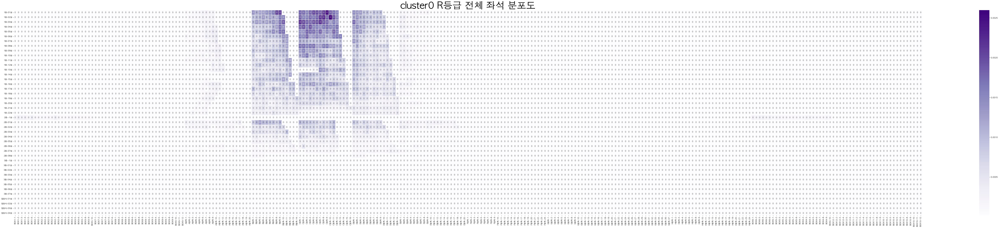

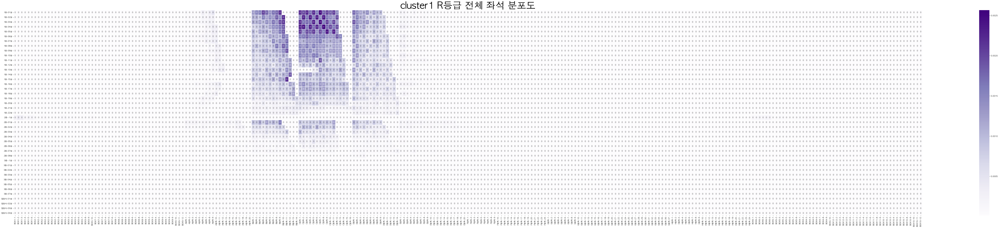

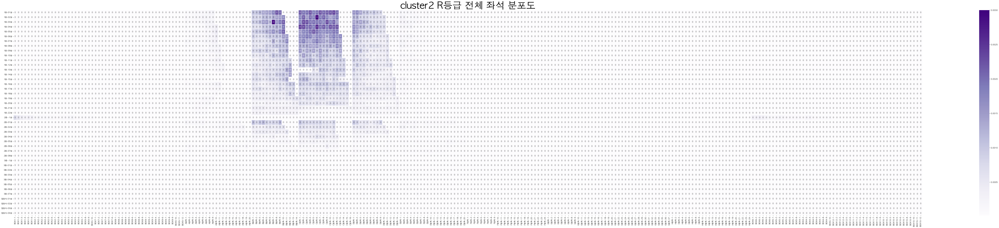

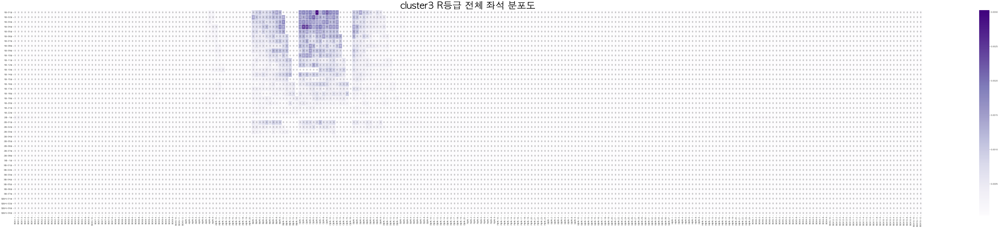

In [30]:
# R등급 시각화하여 비교
cluster_heatmap(df=df0, dfcase=dfcase, place = '콘서트홀', seat_grade = 'R', cluster_name = 'cluster0', floorblock=False, all=True)
cluster_heatmap(df=df1, dfcase=dfcase, place = '콘서트홀', seat_grade = 'R', cluster_name = 'cluster1', floorblock=False, all=True)
cluster_heatmap(df=df2, dfcase=dfcase, place = '콘서트홀', seat_grade = 'R', cluster_name = 'cluster2', floorblock=False, all=True)
cluster_heatmap(df=df3, dfcase=dfcase, place = '콘서트홀', seat_grade = 'R', cluster_name = 'cluster3', floorblock=False, all=True)
# cluster_heatmap(df=df4, dfcase=dfcase, place = '콘서트홀', seat_grade = 'R', cluster_name = 'cluster4', floorblock=False, all=True)
# cluster_heatmap(df=df5, dfcase=dfcase, place = '콘서트홀', seat_grade = 'R', cluster_name = 'cluster5', floorblock=False, all=True)
# cluster_heatmap(df=df6, dfcase=dfcase, place = '콘서트홀', seat_grade = 'R', cluster_name = 'cluster6', floorblock=False, all=True)

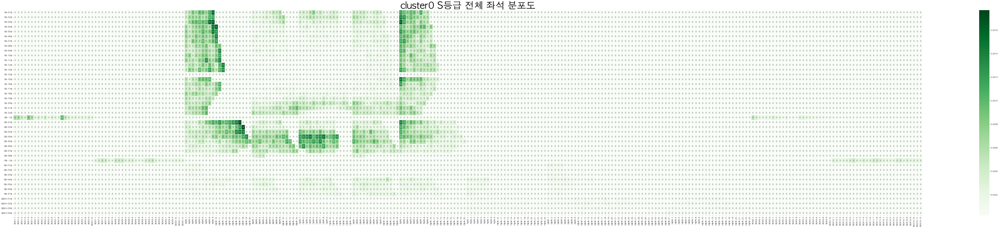

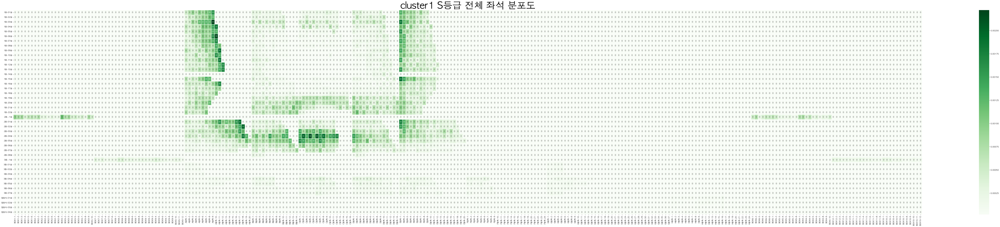

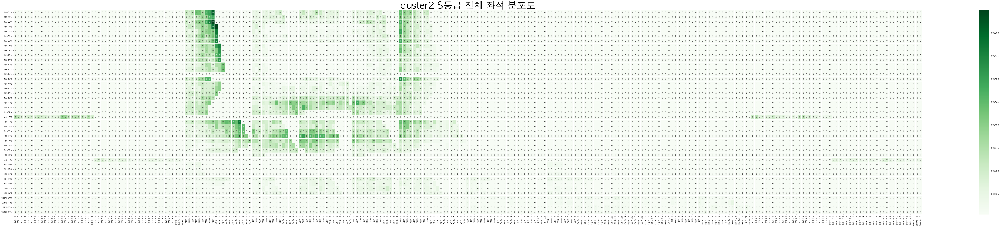

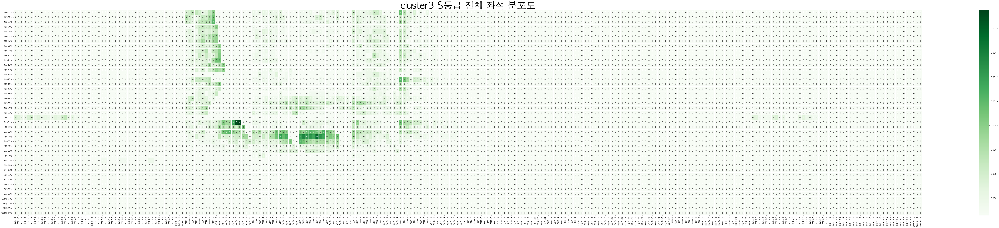

In [31]:
# S등급 시각화하여 비교
cluster_heatmap(df=df0, dfcase=dfcase, place = '콘서트홀', seat_grade = 'S', cluster_name = 'cluster0', floorblock=False, all=True)
cluster_heatmap(df=df1, dfcase=dfcase, place = '콘서트홀', seat_grade = 'S', cluster_name = 'cluster1', floorblock=False, all=True)
cluster_heatmap(df=df2, dfcase=dfcase, place = '콘서트홀', seat_grade = 'S', cluster_name = 'cluster2', floorblock=False, all=True)
cluster_heatmap(df=df3, dfcase=dfcase, place = '콘서트홀', seat_grade = 'S', cluster_name = 'cluster3', floorblock=False, all=True)
# cluster_heatmap(df=df4, dfcase=dfcase, place = '콘서트홀', seat_grade = 'S', cluster_name = 'cluster4', floorblock=False, all=True)
# cluster_heatmap(df=df5, dfcase=dfcase, place = '콘서트홀', seat_grade = 'S', cluster_name = 'cluster5', floorblock=False, all=True)
# cluster_heatmap(df=df6, dfcase=dfcase, place = '콘서트홀', seat_grade = 'S', cluster_name = 'cluster6', floorblock=False, all=True)

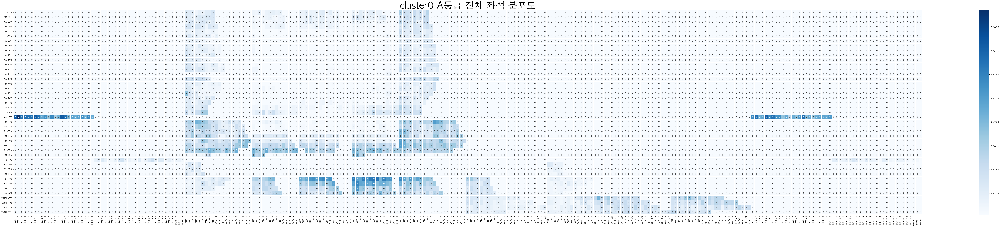

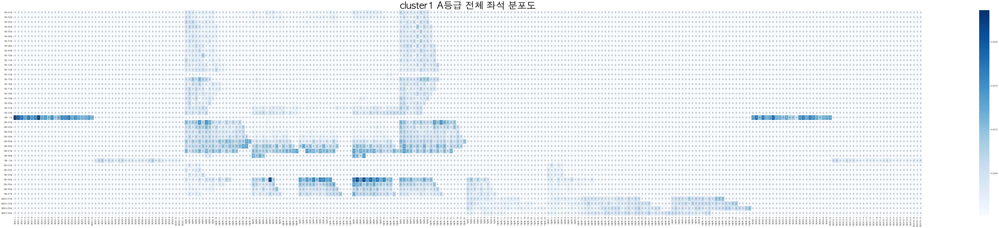

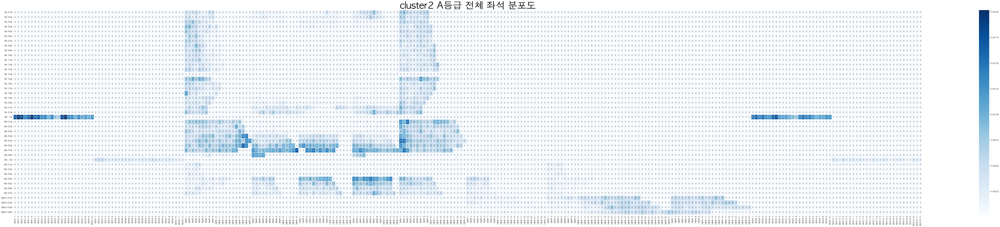

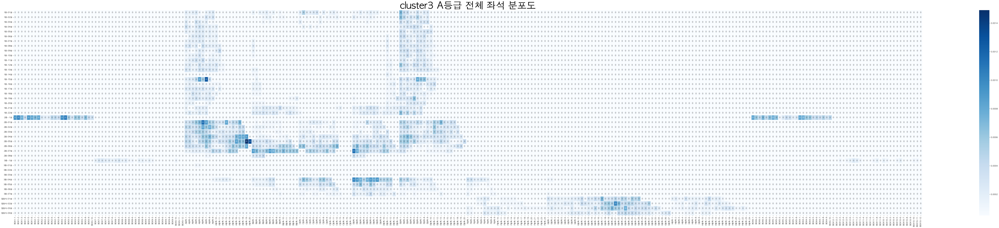

In [32]:
# A등급 시각화하여 비교
cluster_heatmap(df=df0, dfcase=dfcase, place = '콘서트홀', seat_grade = 'A', cluster_name = 'cluster0', floorblock=False, all=True)
cluster_heatmap(df=df1, dfcase=dfcase, place = '콘서트홀', seat_grade = 'A', cluster_name = 'cluster1', floorblock=False, all=True)
cluster_heatmap(df=df2, dfcase=dfcase, place = '콘서트홀', seat_grade = 'A', cluster_name = 'cluster2', floorblock=False, all=True)
cluster_heatmap(df=df3, dfcase=dfcase, place = '콘서트홀', seat_grade = 'A', cluster_name = 'cluster3', floorblock=False, all=True)
# cluster_heatmap(df=df4, dfcase=dfcase, place = '콘서트홀', seat_grade = 'A', cluster_name = 'cluster4', floorblock=False, all=True)
# cluster_heatmap(df=df5, dfcase=dfcase, place = '콘서트홀', seat_grade = 'A', cluster_name = 'cluster5', floorblock=False, all=True)
# cluster_heatmap(df=df6, dfcase=dfcase, place = '콘서트홀', seat_grade = 'A', cluster_name = 'cluster6', floorblock=False, all=True)

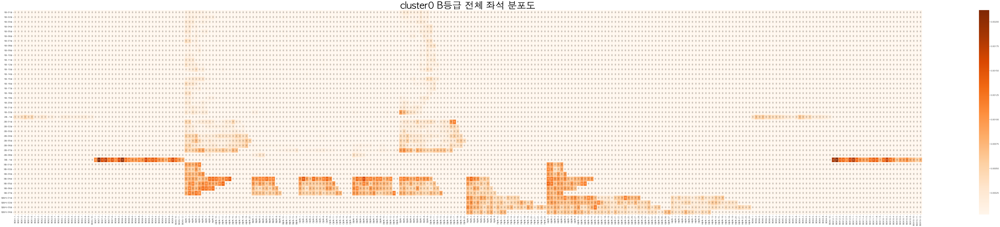

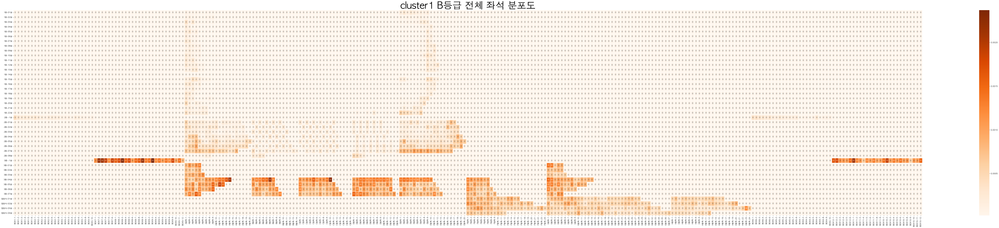

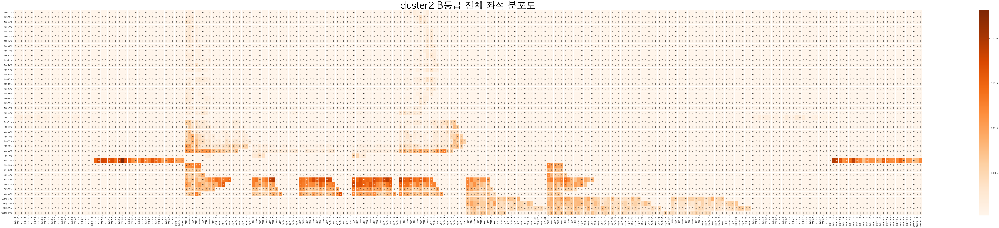

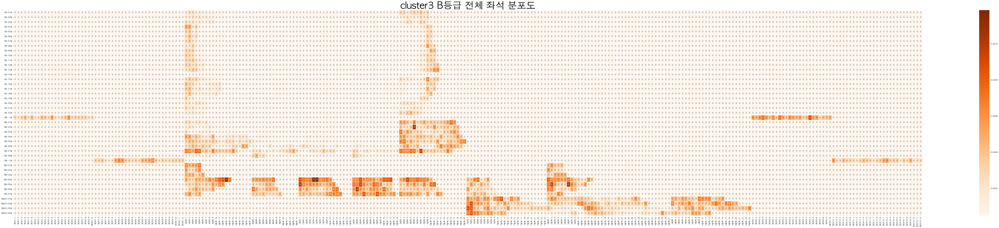

In [33]:
# B등급 시각화하여 비교
cluster_heatmap(df=df0, dfcase=dfcase, place = '콘서트홀', seat_grade = 'B', cluster_name = 'cluster0', floorblock=False, all=True)
cluster_heatmap(df=df1, dfcase=dfcase, place = '콘서트홀', seat_grade = 'B', cluster_name = 'cluster1', floorblock=False, all=True)
cluster_heatmap(df=df2, dfcase=dfcase, place = '콘서트홀', seat_grade = 'B', cluster_name = 'cluster2', floorblock=False, all=True)
cluster_heatmap(df=df3, dfcase=dfcase, place = '콘서트홀', seat_grade = 'B', cluster_name = 'cluster3', floorblock=False, all=True)
# cluster_heatmap(df=df4, dfcase=dfcase, place = '콘서트홀', seat_grade = 'B', cluster_name = 'cluster4', floorblock=False, all=True)
# cluster_heatmap(df=df5, dfcase=dfcase, place = '콘서트홀', seat_grade = 'B', cluster_name = 'cluster5', floorblock=False, all=True)
# cluster_heatmap(df=df6, dfcase=dfcase, place = '콘서트홀', seat_grade = 'B', cluster_name = 'cluster6', floorblock=False, all=True)

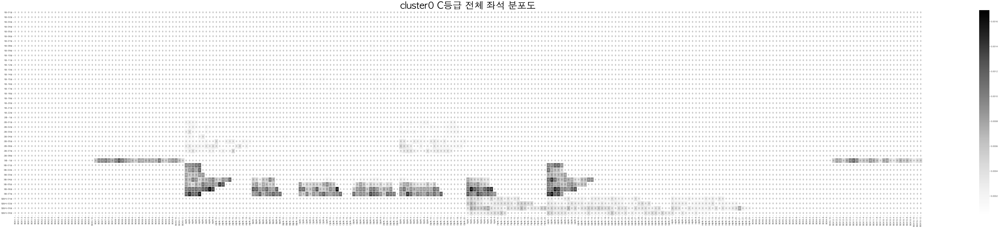

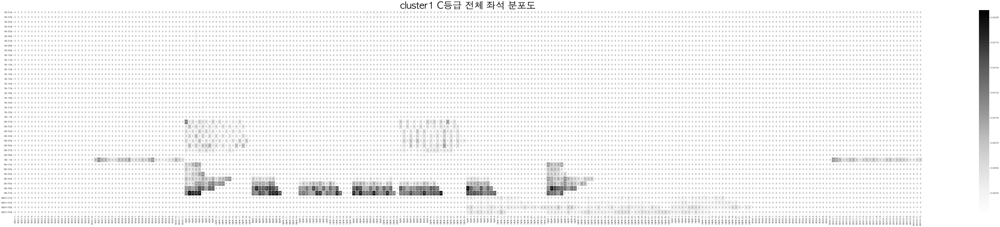

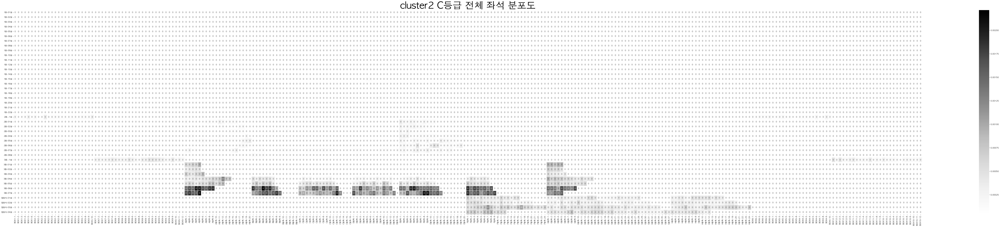

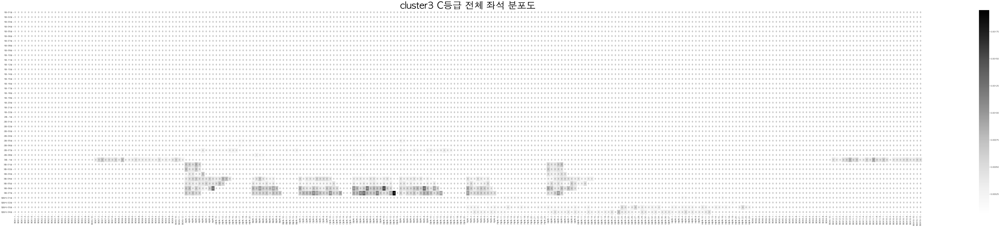

In [34]:
# C등급 시각화하여 비교
cluster_heatmap(df=df0, dfcase=dfcase, place = '콘서트홀', seat_grade = 'C', cluster_name = 'cluster0', floorblock=False, all=True)
cluster_heatmap(df=df1, dfcase=dfcase, place = '콘서트홀', seat_grade = 'C', cluster_name = 'cluster1', floorblock=False, all=True)
cluster_heatmap(df=df2, dfcase=dfcase, place = '콘서트홀', seat_grade = 'C', cluster_name = 'cluster2', floorblock=False, all=True)
cluster_heatmap(df=df3, dfcase=dfcase, place = '콘서트홀', seat_grade = 'C', cluster_name = 'cluster3', floorblock=False, all=True)
# cluster_heatmap(df=df4, dfcase=dfcase, place = '콘서트홀', seat_grade = 'C', cluster_name = 'cluster4', floorblock=False, all=True)
# cluster_heatmap(df=df5, dfcase=dfcase, place = '콘서트홀', seat_grade = 'C', cluster_name = 'cluster5', floorblock=False, all=True)
# cluster_heatmap(df=df6, dfcase=dfcase, place = '콘서트홀', seat_grade = 'C', cluster_name = 'cluster6', floorblock=False, all=True)

In [24]:

# 1. place, seat_grade 인자에 따라 달라지게 설정
df_place = df.query(f"`place` == '콘서트홀'").sort_values(by='play')
df_grade = df_place.query(f"`grade`=='R'")


# 2-1. 원본 데이터 pivot table 교차빈도값 획득 후 저장(->return)
df_pivot_fb_raw = df_grade.pivot_table(index='seat_floor', columns='seat_block', aggfunc='size', fill_value=0) #size : 조합

# 2-2. 시각화를 위한 처리 진행
dfG = df_grade.copy()
dfG = pd.concat([dfG,dfcase]).fillna(-1).reset_index() #껍데기 만들기 작업
dfG[['seat_floor','seat_col','seat_num']] = dfG[['seat_floor','seat_col','seat_num']].astype(int)
# seat_floor "층" 추가, 4층은 합창석으로 대체
dfG['seat_floor'] = dfG['seat_floor'].astype(str) + "층"
dfG['seat_floor'] = dfG['seat_floor'].replace("4층","합창석")
# seat_block 길이가 1인 경우 "블록" 추가, seat_col "열" 추가
dfG['seat_block'] = dfG['seat_block'].astype(str)
dfG.loc[dfG['seat_block'].str.len() == 1, 'seat_block'] = dfG['seat_block'] + "블록"
dfG['seat_col'] = dfG['seat_col'].astype(str).str.zfill(2) + "열"

# 2-3. 편집된 dfG로 pivot_table화 및 값 정렬
df_pivot_fb = dfG.pivot_table(index='seat_floor', columns='seat_block', aggfunc='size', fill_value=0) #size : 조합
df_pivot_fb = df_pivot_fb.loc[['1층','2층','3층','합창석']] #row
df_pivot_fb = df_pivot_fb[['BOX1','BOX2','BOX3','BOX7','BOX8','BOX9','A블록','B블록','C블록','D블록','E블록','F블록','G블록','H블록','BOX6','BOX5','BOX4','BOX12','BOX11','BOX10']] #col
df_pivot_fb


seat_block,BOX1,BOX2,BOX3,BOX7,BOX8,BOX9,A블록,B블록,C블록,D블록,E블록,F블록,G블록,H블록,BOX6,BOX5,BOX4,BOX12,BOX11,BOX10
seat_floor,,,,,,,,,,,,,,,,,,,,
1층,132,176,220,132,198,264,4925,44397,68292,33430,3341,528,814,528,132,176,220,132,198,264
2층,410,222,240,54,81,108,1471,5674,7137,4243,1538,216,333,216,307,216,248,54,81,108
3층,48,64,80,52,77,103,205,135,177,152,189,204,316,192,48,64,80,53,74,101
합창석,24,32,40,24,36,48,80,56,64,56,80,155,239,152,24,32,40,24,36,48


In [26]:
df_pivot_fb_test = df_pivot_fb.apply(lambda x : x / df_pivot_fb.values.sum())
df_pivot_fb_test

seat_block,BOX1,BOX2,BOX3,BOX7,BOX8,BOX9,A블록,B블록,C블록,D블록,E블록,F블록,G블록,H블록,BOX6,BOX5,BOX4,BOX12,BOX11,BOX10
seat_floor,,,,,,,,,,,,,,,,,,,,
1층,0.000713,0.000951,0.001188,0.000713,0.001069,0.001426,0.026599,0.239776,0.368827,0.180547,0.018044,0.002852,0.004396,0.002852,0.000713,0.000951,0.001188,0.000713,0.001069,0.001426
2층,0.002214,0.001199,0.001296,0.000292,0.000437,0.000583,0.007944,0.030644,0.038545,0.022915,0.008306,0.001167,0.001798,0.001167,0.001658,0.001167,0.001339,0.000292,0.000437,0.000583
3층,0.000259,0.000346,0.000432,0.000281,0.000416,0.000556,0.001107,0.000729,0.000956,0.000821,0.001021,0.001102,0.001707,0.001037,0.000259,0.000346,0.000432,0.000286,0.000400,0.000545
합창석,0.000130,0.000173,0.000216,0.000130,0.000194,0.000259,0.000432,0.000302,0.000346,0.000302,0.000432,0.000837,0.001291,0.000821,0.000130,0.000173,0.000216,0.000130,0.000194,0.000259


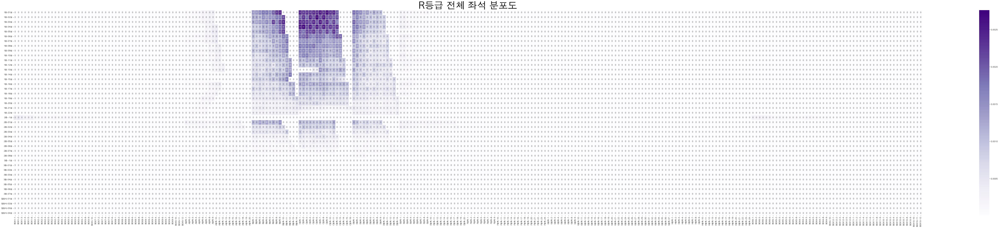

In [27]:
# 3-1. 원본 데이터 pivot table 교차빈도값 획득 후 저장(->return)
df_pivot_all_raw = df_grade.pivot_table(index=['seat_floor','seat_col'], columns=['seat_block','seat_num'], aggfunc='size', fill_value=0) 

# 3-2. 시각화를 위한 처리 진행
dfG = df_grade.copy()
dfG = pd.concat([dfG,dfcase]).fillna(-1).reset_index()
dfG[['seat_floor','seat_col','seat_num']] = dfG[['seat_floor','seat_col','seat_num']].astype(int)
# seat_floor "층" 추가, 4층은 합창석으로 대체
dfG['seat_floor'] = dfG['seat_floor'].astype(str) + "층"
dfG['seat_floor'] = dfG['seat_floor'].replace("4층","합창석")
# seat_block 길이가 1인 경우 "블록" 추가, seat_col "열" 추가
dfG['seat_block'] = dfG['seat_block'].astype(str)
dfG.loc[dfG['seat_block'].str.len() == 1, 'seat_block'] = dfG['seat_block'] + "블록"
dfG['seat_col'] = dfG['seat_col'].astype(str).str.zfill(2) + "열"

# 3-3. 편집된 dfG로 pivot_table화 및 값 정렬
df_pivot_all = dfG.pivot_table(index=['seat_floor','seat_col'], columns=['seat_block','seat_num'], aggfunc='size', fill_value=0) #size : 조합
seat_floor_order = ['1층','2층','3층','합창석']
seat_block_order = ['BOX1','BOX2','BOX3','BOX7','BOX8','BOX9','A블록','B블록','C블록','D블록','E블록','F블록','G블록','H블록','BOX6','BOX5','BOX4','BOX12','BOX11','BOX10']
df_pivot_all = df_pivot_all.apply(lambda x : x / df_pivot_all.values.sum())
df_pivot_all = df_pivot_all.loc[seat_floor_order, seat_block_order]

# 3-4. 히트맵 그리기
plt.figure(figsize=(110, 20))
sns.heatmap(df_pivot_all, annot=True, annot_kws={"size": 10}, linewidths=0.1, linecolor='white', fmt='.0f', cmap='Purples')

plt.title(f"R등급 전체 좌석 분포도", size=50, weight='bold') #제목
plt.xlabel('')
plt.ylabel('')
plt.xticks(size=10)
plt.yticks(size=10)
plt.show()